# Forecasting with Prophet

In [1]:
import pandas as pd

In [2]:
from prophet import Prophet

In [3]:
pm = pd.read_csv("cleaned_pm25_data.csv", parse_dates = [0])

In [4]:
pm

,DateTime,Year,Month,DayOfMonth,DayOfWeek,DayOfYear,Hour,PM2.5,WindNvec,WindEvec
0,2001-05-22 08:00:00,2001,5,2001-05-22,1,142,8,10.0,-2.448551,-1.553898
1,2001-05-22 09:00:00,2001,5,2001-05-22,1,142,9,13.1,-3.000936,-2.164343
2,2001-05-22 10:00:00,2001,5,2001-05-22,1,142,10,34.5,-2.594104,-3.919263
3,2001-05-22 11:00:00,2001,5,2001-05-22,1,142,11,0.1,-3.389372,-5.663228
4,2001-05-22 12:00:00,2001,5,2001-05-22,1,142,12,9.0,-3.902914,-6.521293
...,...,...,...,...,...,...,...,...,...,...
135904,2021-12-31 19:00:00,2021,12,2021-12-31,4,365,19,9.0,1.963254,0.381618
135905,2021-12-31 20:00:00,2021,12,2021-12-31,4,365,20,15.0,2.998172,0.104698
135906,2021-12-31 21:00:00,2021,12,2021-12-31,4,365,21,11.0,1.985092,0.243739
135907,2021-12-31 22:00:00,2021,12,2021-12-31,4,365,22,34.0,2.983566,0.313585


In [5]:
pm.dtypes

DateTime      datetime64[ns]
Year                   int64
Month                  int64
DayOfMonth            object
DayOfWeek              int64
DayOfYear              int64
Hour                   int64
PM2.5                float64
WindNvec             float64
WindEvec             float64
dtype: object

In [6]:
df = pm[["DateTime", "PM2.5"]]
# Prophet requires specific column names
df.columns = ["ds", "y"]

In [7]:
from datetime import datetime

In [8]:
# Use 2019, 2020, and all but December 2021 as the training set.
df_train = df[(df["ds"] >= datetime(2019, 1, 1)) & (df["ds"] < datetime(2021, 12, 1))]
df_train

,ds,y
111160,2019-01-01 00:00:00,45.0
111161,2019-01-01 01:00:00,30.0
111162,2019-01-01 02:00:00,37.0
111163,2019-01-01 03:00:00,43.0
111164,2019-01-01 04:00:00,42.0
...,...,...
135189,2021-11-30 19:00:00,29.0
135190,2021-11-30 20:00:00,32.0
135191,2021-11-30 21:00:00,43.0
135192,2021-11-30 22:00:00,40.0


In [9]:
# Use December 2021 as the test set
df_test = df[(df["ds"] >= datetime(2021, 12, 1)) & (df["ds"] < datetime(2022, 1, 1))]
df_test

,ds,y
135194,2021-12-01 01:00:00,25.0
135195,2021-12-01 02:00:00,26.0
135196,2021-12-01 04:00:00,19.0
135197,2021-12-01 05:00:00,18.0
135198,2021-12-01 06:00:00,22.0
...,...,...
135904,2021-12-31 19:00:00,9.0
135905,2021-12-31 20:00:00,15.0
135906,2021-12-31 21:00:00,11.0
135907,2021-12-31 22:00:00,34.0


In [10]:
prophet = Prophet()

In [11]:
prophet.fit(df_train)

/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -860.383


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       48790.9     0.0145294       3017.14      0.7791      0.7791      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       48911.3     0.0160621       1039.08           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       48983.2     0.0405896       1651.22           1           1      351   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       49020.8    0.00165353       853.314      0.4858      0.4858      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       49058.6    0.00108207       160.729           1           1      576   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599     

In [12]:
# Prepare to generate 744 predictions (= hourly for 31 days)
future = prophet.make_future_dataframe(periods = 744, freq = "H")
future.tail()

,ds
24773,2021-12-31 19:00:00
24774,2021-12-31 20:00:00
24775,2021-12-31 21:00:00
24776,2021-12-31 22:00:00
24777,2021-12-31 23:00:00


In [13]:
preds = prophet.predict(future)

/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


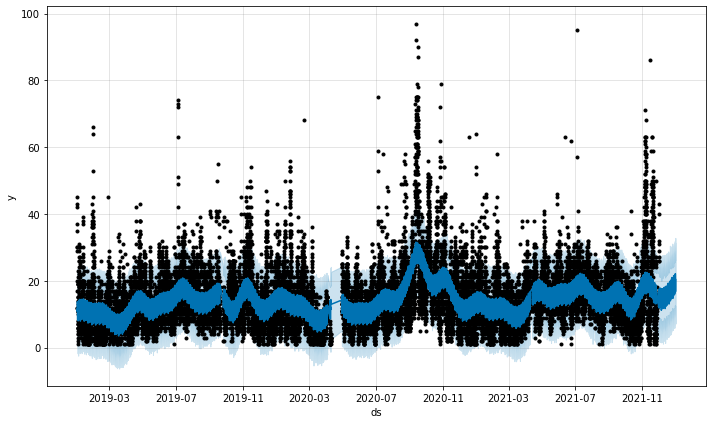

In [14]:
plot = prophet.plot(preds)

In [15]:
from prophet.plot import plot_plotly, plot_components_plotly

In [17]:
# The full *preds* dataframe is going to be massive if plotted. Slice it to just the latest historical data + predictions.
preds_short = preds[preds["ds"] >= datetime(2021, 1, 1)]

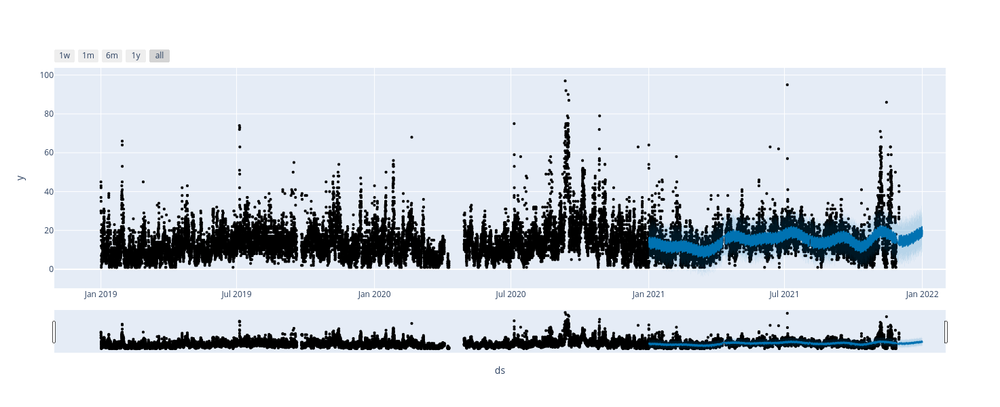

In [18]:
plot = plot_plotly(prophet, preds_short)
plot.show()

/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/home/josh/miniconda3/envs/time-preds/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



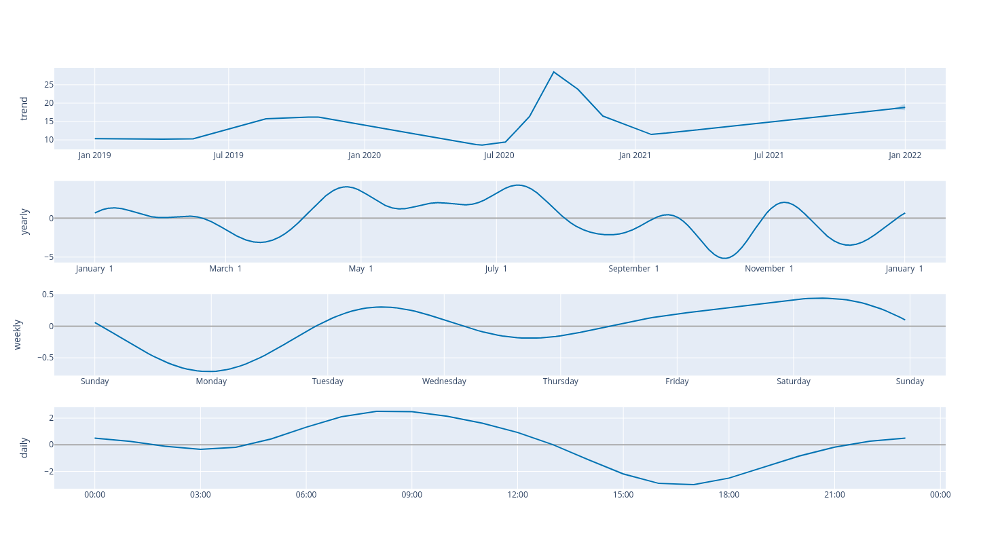

In [24]:
plot_components_plotly(prophet, preds)